In [19]:
# Fix for importing utils
import sys, os
SCRIPT_DIR = os.path.dirname(os.path.abspath('__file__'))
sys.path.append(os.path.dirname(os.path.dirname(SCRIPT_DIR)))
from analysis.utils import utils

import matplotlib.pyplot as plt
import matplotlib
import pandas as pd
import numpy as np
import seaborn as sns
from pathlib import Path
import ipywidgets as widgets
from IPython.display import display, Image
import dataframe_image as dfi

np.set_printoptions(suppress=True, formatter={'float_kind':'{:f}'.format})
font = {'family' : 'Ubuntu',
        'size'   : 22}

matplotlib.rc('font', **font)

# Visualization of ZPOS Data

Expects folder tree structure of

```
./
|- 02_Pozyx_Positioning_Data
|   |-KITCHEN
|   |-ZPOS
|
|- 03_Labels
    |-KITCHEN
    |-ZPOS
```
- Sitting was at around 10cm off of the ground. Standing was at around 1.6m


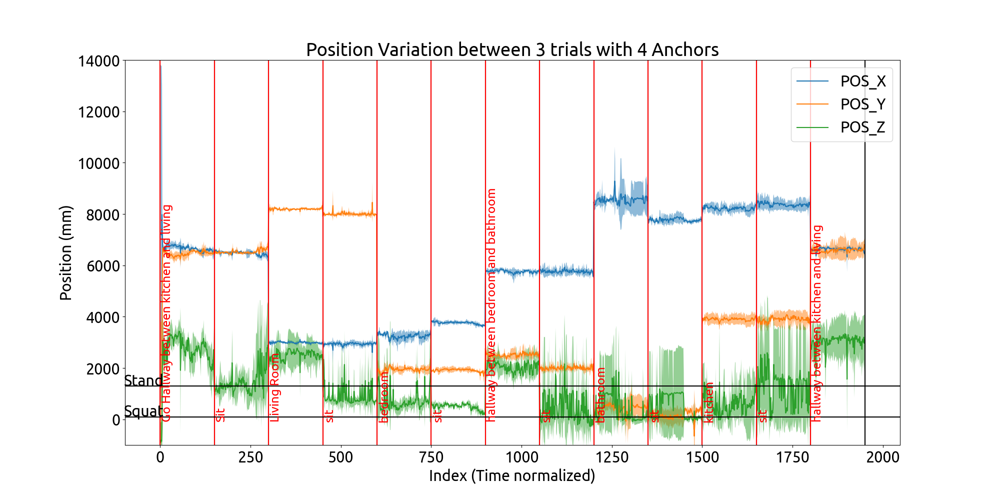

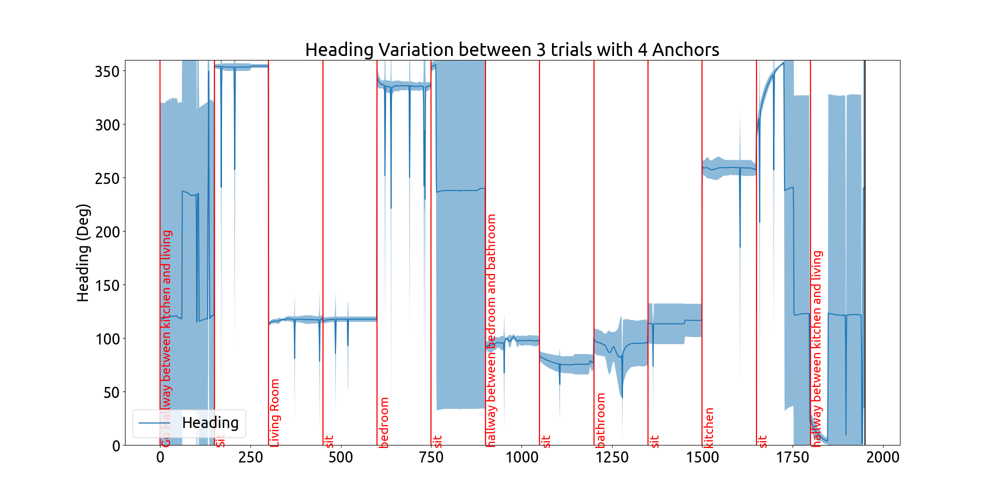

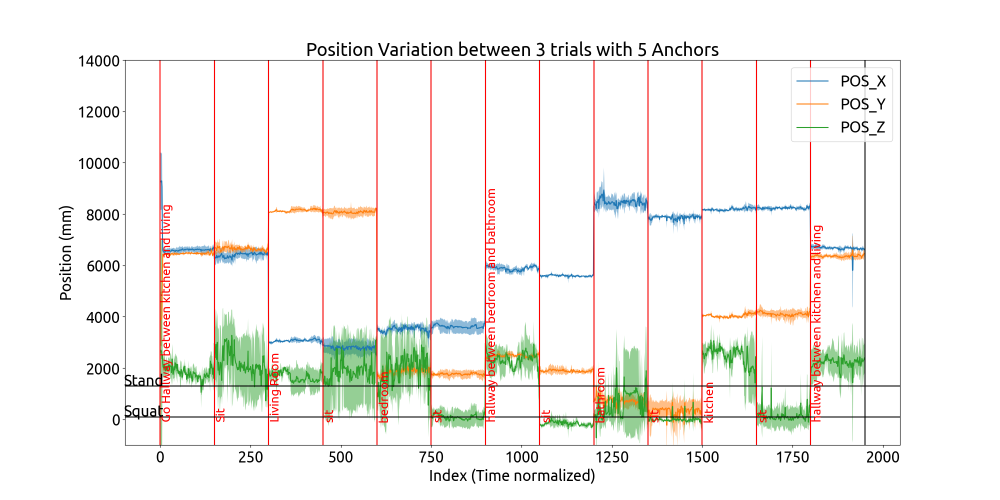

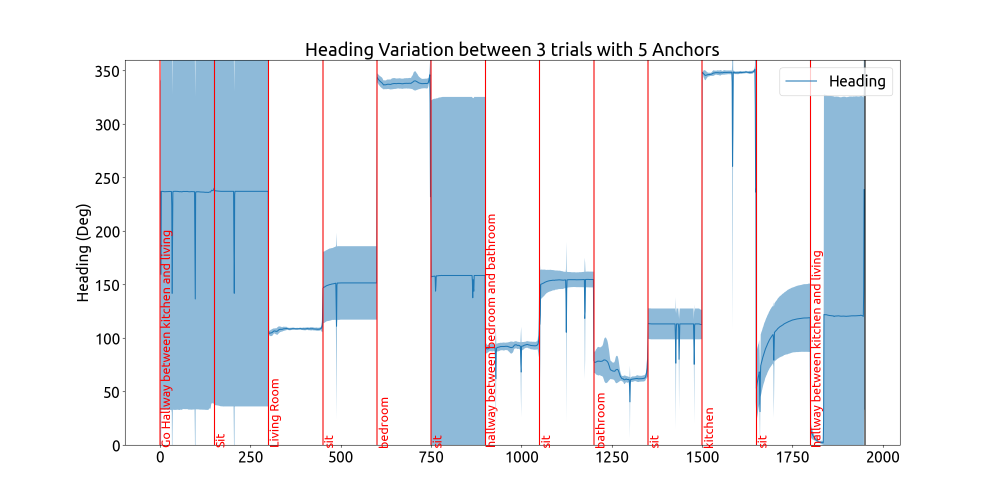

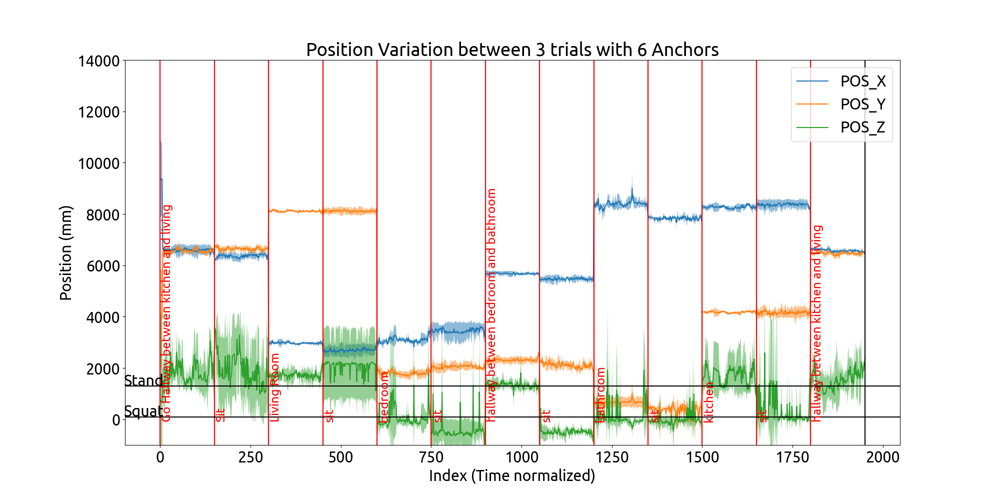

...

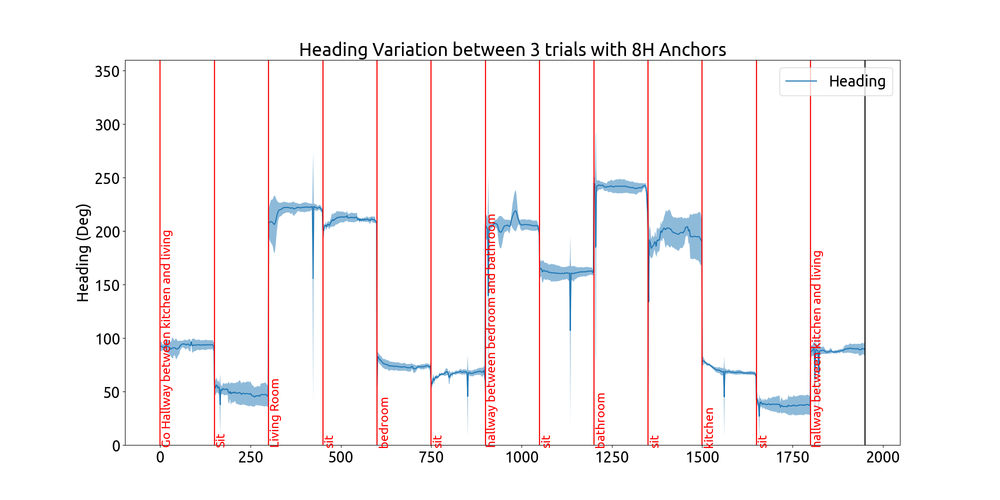

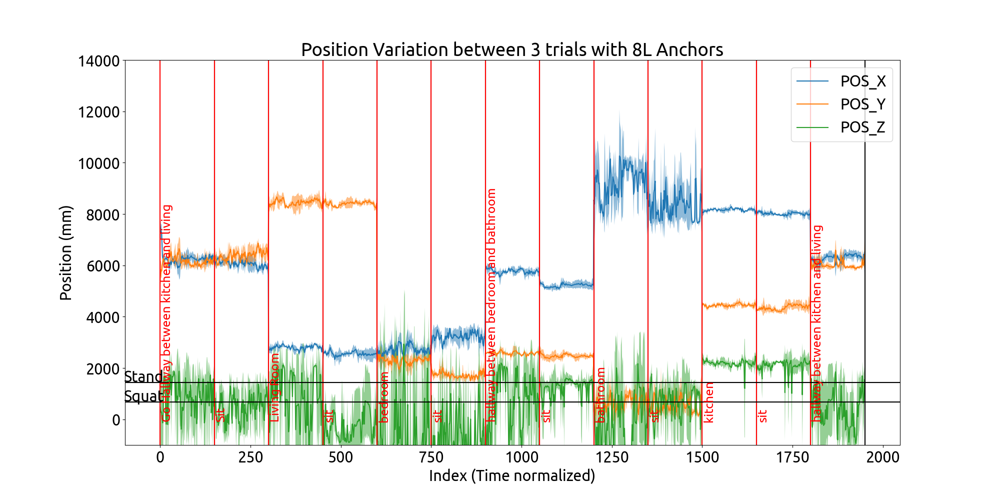

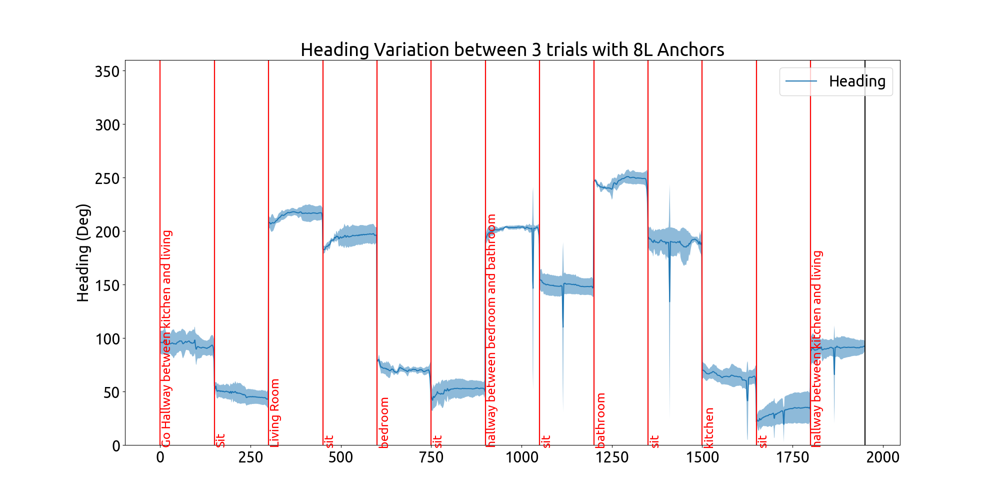

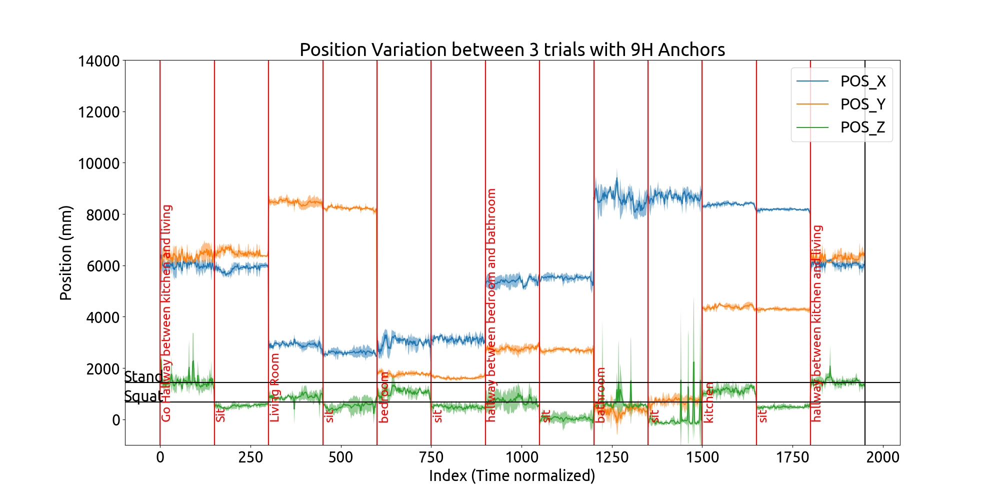

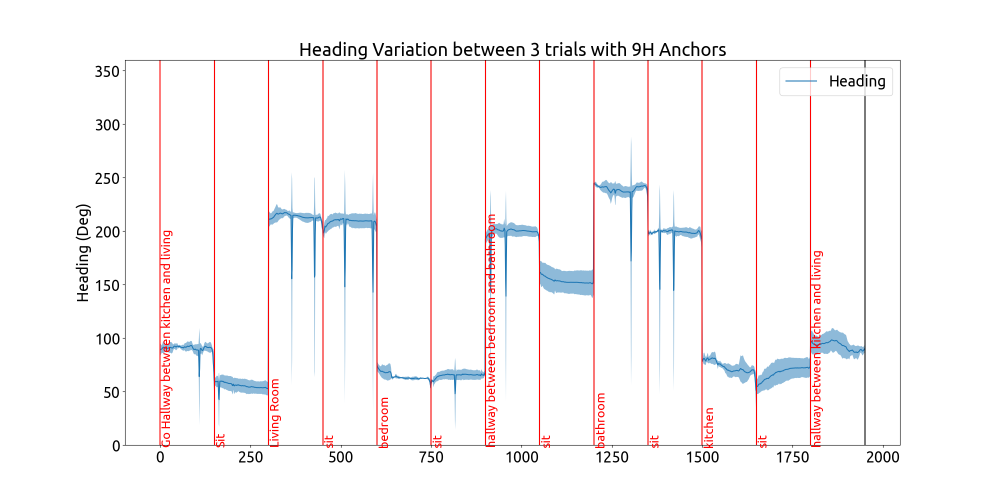

In [56]:
labels_dir = "03_Labels"
data_dir = "02_Pozyx_Positioning_Data"
NUM_NORM_POINTS = 150
TRIAL_NUM = 3
ANCHOR_CONFIG = ["4", "5", "6", "8", "10", "8H", "8L", "9H"]
HEIGHTS = {
    "4": {"stand": 1294, "sit": 97},
	"5": {"stand": 1294, "sit": 97},
	"6": {"stand": 1294, "sit": 97},
	"8": {"stand": 1440, "sit": 685},
	"10": {"stand": 1440, "sit": 685},
	"8H": {"stand": 1440, "sit": 685},
	"8L": {"stand": 1440, "sit": 685},
	"9H": {"stand": 1440, "sit": 685}
}

%matplotlib widget
for anchor in ANCHOR_CONFIG:
    processed_trials = pd.DataFrame()
    for trial in range(TRIAL_NUM):
        TYPE = "ZPOS"
        ANCHORS = anchor
        TRIAL = trial+1

        label_fn = f"{TYPE}_A{ANCHORS}_{TRIAL}.txt"
        data_fn = f"{TYPE}_A{ANCHORS}_{TRIAL}.csv"

        label_fp = Path('.').joinpath(labels_dir, TYPE, label_fn)
        data_fp = Path('.').joinpath(data_dir, TYPE, data_fn)

        labels = utils.extract_time_labels(label_fp)

        data = pd.read_csv(data_fp)
        if (len(data.columns) == 14):
            data.columns = ['Timestamp', 'POS_X', 'POS_Y', 'POS_Z', 'Heading', 'Pitch', 'Roll', 'ACC_X', 'ACC_Y', 'ACC_Z', 'GYRO_X', 'GYRO_Y','GYRO_Z', 'TagId']
        else:
            data.columns = ['Timestamp', 'POS_X', 'POS_Y', 'POS_Z', 'Heading', 'Pitch', 'Roll', 'ACC_X', 'ACC_Y', 'ACC_Z']
        data = data.set_index('Timestamp')

        # Segment the data into only the standing still portions.
        moving_periods = [[float(start['Timestamp']), float(end['Timestamp'])] for (start, end) in zip(labels[1::2], labels[2::2])]
        moving_periods.append([float(labels[-1]['Timestamp']), float(labels[-1]['Timestamp'])+120])
        standing_periods = [[float(start['Timestamp']), float(end['Timestamp'])] for (start, end) in zip(labels[0::2], labels[1::2])]

        ##################### CLEANING THE DATA ########################## 
        cleaned_data = (data
                        .iloc[:, :-1]
                        .pipe(utils.remove_periods, moving_periods)
                        .pipe(utils.interp1d_periods, standing_periods, num_points=NUM_NORM_POINTS)
                        .reset_index(drop=True)
                    )
        ##################################################################


        # To normalize in time, drop the index and fix the indexing (make start overlap with 10sec end so red vertical line overlays black 10 sec elapsed line)
        index = 0
        drop_index_labels = []
        for ind, _ in enumerate(labels[0::2]):
            drop_index_labels.append({'Timestamp': index, 'Label': labels[ind*2]['Label']})
            index += NUM_NORM_POINTS
            drop_index_labels.append({'Timestamp': index, 'Label': labels[ind*2+1]['Label']})


        # utils.plot_pozyx_data_with_timings(cleaned_data, ['POS_X', 'POS_Y', 'POS_Z'], drop_index_labels)
        # utils.plot_pozyx_data_with_timings(cleaned_data, ['Heading'], drop_index_labels, ylim=(0,360))
        processed_trials = pd.concat([processed_trials, cleaned_data], axis=0)

    # Means and Standard deviations for ensemble averages
    means = processed_trials.groupby(processed_trials.index).mean()
    stds = processed_trials.groupby(processed_trials.index).std()

    # Position
    ax = utils.plot_pozyx_data_with_timings(means, ['POS_X', 'POS_Y', 'POS_Z'], drop_index_labels, ylim=(-1000, 14000))
    ax.fill_between(means.index, means['POS_X'] + stds['POS_X'], means['POS_X'] - stds['POS_X'], alpha=0.5)
    ax.fill_between(means.index, means['POS_Y'] + stds['POS_Y'], means['POS_Y'] - stds['POS_Y'], alpha=0.5)
    ax.fill_between(means.index, means['POS_Z'] + stds['POS_Z'], means['POS_Z'] - stds['POS_Z'], alpha=0.5)
    ax.set_title(f"Position Variation between {TRIAL_NUM} trials with {ANCHORS} Anchors")
    ax.set_xlabel("Index (Time normalized)")
    ax.axhline(HEIGHTS[anchor]["stand"], color="black")
    ax.text(-100, HEIGHTS[anchor]["stand"]+10, "Stand")
    ax.axhline(HEIGHTS[anchor]["sit"], color="black")
    ax.text(-100, HEIGHTS[anchor]["sit"]+10, "Squat")

    # Heading
    ax = utils.plot_pozyx_data_with_timings(means, ['Heading'], drop_index_labels, ylim=(0, 360), ylabel="Heading (Deg)")
    ax.fill_between(means.index, means['Heading'] + stds['Heading'], means['Heading'] - stds['Heading'], alpha=0.5)
    ax.set_title(f"Heading Variation between {TRIAL_NUM} trials with {ANCHORS} Anchors")

In [48]:


pd.set_option('display.float_format', lambda x: '%.5f' % x)
labels_dir = "03_Labels"
data_dir = "02_Pozyx_Positioning_Data"
NUM_NORM_POINTS = 150
TRIAL_NUM = 3
ANCHOR_CONFIG = ["4", "5", "6", "8", "10", "8H", "8L", "9H"]
HEIGHTS = {
    "4": {"stand": 1294, "sit": 97},
	"5": {"stand": 1294, "sit": 97},
	"6": {"stand": 1294, "sit": 97},
	"8": {"stand": 1440, "sit": 685},
	"10": {"stand": 1440, "sit": 685},
	"8H": {"stand": 1440, "sit": 685},
	"8L": {"stand": 1440, "sit": 685},
	"9H": {"stand": 1440, "sit": 685}
}

all_stds = pd.DataFrame()
all_means = pd.DataFrame()

%matplotlib inline
for anchor in ANCHOR_CONFIG:
    processed_trials = pd.DataFrame()
    for trial in range(TRIAL_NUM):
        TYPE = "ZPOS"
        ANCHORS = anchor
        TRIAL = trial+1

        label_fn = f"{TYPE}_A{ANCHORS}_{TRIAL}.txt"
        data_fn = f"{TYPE}_A{ANCHORS}_{TRIAL}.csv"

        label_fp = Path('.').joinpath(labels_dir, TYPE, label_fn)
        data_fp = Path('.').joinpath(data_dir, TYPE, data_fn)

        labels = utils.extract_time_labels(label_fp)

        data = pd.read_csv(data_fp)
        if (len(data.columns) == 14):
            data.columns = ['Timestamp', 'POS_X', 'POS_Y', 'POS_Z', 'Heading', 'Pitch', 'Roll', 'ACC_X', 'ACC_Y', 'ACC_Z', 'GYRO_X', 'GYRO_Y','GYRO_Z', 'TagId']
        else:
            data.columns = ['Timestamp', 'POS_X', 'POS_Y', 'POS_Z', 'Heading', 'Pitch', 'Roll', 'ACC_X', 'ACC_Y', 'ACC_Z']
        data = data.set_index('Timestamp')

        # Segment the data into only the standing still portions.
        moving_periods = [[float(start['Timestamp']), float(end['Timestamp'])] for (start, end) in zip(labels[1::2], labels[2::2])]
        moving_periods.append([float(labels[-1]['Timestamp']), float(labels[-1]['Timestamp'])+120])
        standing_periods = [[float(start['Timestamp']), float(end['Timestamp'])] for (start, end) in zip(labels[0::2], labels[1::2])]

        ##################### CLEANING THE DATA ########################## 
        cleaned_data = (data
                        .iloc[:, :-1]
                        .pipe(utils.remove_periods, moving_periods)
                        .pipe(utils.interp1d_periods, standing_periods, num_points=NUM_NORM_POINTS)
                        .reset_index(drop=True)
                    )
        ##################################################################

        # To normalize in time, drop the index and fix the indexing (make start overlap with 10sec end)
        index = 0
        drop_index_labels = []
        for ind, _ in enumerate(labels[0::2]):
            drop_index_labels.append({'Timestamp': index, 'Label': labels[ind*2]['Label']})
            index += NUM_NORM_POINTS
            drop_index_labels.append({'Timestamp': index, 'Label': labels[ind*2+1]['Label']})

        # Add the locations to each standing/sitting portion
        index = 0
        filtered_labels = list(sorted(list(filter(lambda x: x['Label'] != '10 sec elapsed', drop_index_labels)), key=lambda x: float(x['Timestamp'])))
        for ind, _ in enumerate(filtered_labels[0::2]):
            cleaned_data.loc[index:index+NUM_NORM_POINTS, 'Location'] = filtered_labels[ind*2]['Label']
            if ind*2 + 1 < len(filtered_labels):
                cleaned_data.loc[index+NUM_NORM_POINTS:index+2*NUM_NORM_POINTS, 'Location'] = filtered_labels[ind*2]['Label'] + "(sit)"
            index += 2*NUM_NORM_POINTS

        processed_trials = pd.concat([processed_trials, cleaned_data], axis=0)
        pd.set_option('display.max_rows', processed_trials.shape[0]+1)

    # Means and Standard deviations for ensemble averages
    means = processed_trials.groupby(processed_trials.Location).mean().loc[:, "POS_Z"]
    stds = processed_trials.groupby(processed_trials.Location).std().loc[:, "POS_Z"]

    stds.name = stds.name + f"_A{anchor}"
    means.name = means.name + f"_A{anchor}"
    all_stds = pd.concat([all_stds, stds], axis=1)
    all_means = pd.concat([all_means, means], axis=1)
    # stats = pd.concat([means, stds], axis=1)
    # stats.columns = ["POS_Z Mean", "POS_Z Std"]


    # display(stats.style.background_gradient(axis=0))
    # means = means.loc[:, "POS_Z"].style.background_gradient(axis=0)  
    # stds = stds.loc[:, "POS_Z"].style.background_gradient(axis=0)  

    # print("*"*20 + f"A{anchor}" + "*"*20)
    # print("MEANS")
    # display(means)
    # print("STD")
    # display(stds)
display(all_means)

,POS_Z_A4,POS_Z_A5,POS_Z_A6,POS_Z_A8,POS_Z_A10,POS_Z_A8H,POS_Z_A8L,POS_Z_A9H
Go Hallway between kitchen and living,2616.77425,1862.82011,1772.73821,3240.52217,2315.86526,1514.69085,857.51303,1472.15347
Go Hallway between kitchen and living(sit),1466.75325,2174.84695,1936.57905,3007.77642,1731.65717,609.42938,456.79012,525.22287
Living Room,2509.05652,1661.15669,1710.89180,2433.72717,554.69811,859.17860,891.99402,870.19820
Living Room(sit),887.77519,1868.43513,2067.93128,2933.92668,851.54050,377.07112,-285.32348,513.26195
bathroom,454.04114,627.37849,147.23523,2082.39174,1712.62090,1004.01484,-36.24903,636.80492
bathroom(sit),529.05380,-4.93527,-14.68349,2796.23089,1348.51995,421.72259,638.82720,23.03730
bedroom,718.63860,1951.61668,78.24413,3369.13580,3774.89780,-113.34351,-905.50065,1068.78235
bedroom(sit),493.98831,84.14041,-450.50130,3739.98245,720.34128,-124.21756,-739.73593,479.45474
hallway between bedroom and bathroom,2034.00887,2327.99430,1335.18955,3523.37356,1926.27044,1132.01433,717.01244,722.67933
hallway between bedroom and bathroom(sit),430.98733,-164.66578,-493.67688,1527.02362,657.15348,73.59359,1229.05226,32.66033


In [50]:

print(HEIGHTS)
display(all_means)
heights_df = pd.DataFrame(HEIGHTS)
heights_df.columns = ["POS_Z_A"+anchor for anchor in heights_df.columns]
errors = all_means.copy()
for row in all_means.iterrows():
    if "sit" in row[0]:
        errors.loc[row[0], :] = (row[1] - heights_df.loc["sit", :]).abs()
    else:
        errors.loc[row[0], :] = (row[1] - heights_df.loc["stand", :]).abs()
display(heights_df)
display(errors)

{'4': {'stand': 1294, 'sit': 97}, '5': {'stand': 1294, 'sit': 97}, '6': {'stand': 1294, 'sit': 97}, '8': {'stand': 1440, 'sit': 685}, '10': {'stand': 1440, 'sit': 685}, '8H': {'stand': 1440, 'sit': 685}, '8L': {'stand': 1440, 'sit': 685}, '9H': {'stand': 1440, 'sit': 685}}


,POS_Z_A4,POS_Z_A5,POS_Z_A6,POS_Z_A8,POS_Z_A10,POS_Z_A8H,POS_Z_A8L,POS_Z_A9H
Go Hallway between kitchen and living,2616.77425,1862.82011,1772.73821,3240.52217,2315.86526,1514.69085,857.51303,1472.15347
Go Hallway between kitchen and living(sit),1466.75325,2174.84695,1936.57905,3007.77642,1731.65717,609.42938,456.79012,525.22287
Living Room,2509.05652,1661.15669,1710.89180,2433.72717,554.69811,859.17860,891.99402,870.19820
Living Room(sit),887.77519,1868.43513,2067.93128,2933.92668,851.54050,377.07112,-285.32348,513.26195
bathroom,454.04114,627.37849,147.23523,2082.39174,1712.62090,1004.01484,-36.24903,636.80492
bathroom(sit),529.05380,-4.93527,-14.68349,2796.23089,1348.51995,421.72259,638.82720,23.03730
bedroom,718.63860,1951.61668,78.24413,3369.13580,3774.89780,-113.34351,-905.50065,1068.78235
bedroom(sit),493.98831,84.14041,-450.50130,3739.98245,720.34128,-124.21756,-739.73593,479.45474
hallway between bedroom and bathroom,2034.00887,2327.99430,1335.18955,3523.37356,1926.27044,1132.01433,717.01244,722.67933
hallway between bedroom and bathroom(sit),430.98733,-164.66578,-493.67688,1527.02362,657.15348,73.59359,1229.05226,32.66033


,POS_Z_A4,POS_Z_A5,POS_Z_A6,POS_Z_A8,POS_Z_A10,POS_Z_A8H,POS_Z_A8L,POS_Z_A9H
stand,1294,1294,1294,1440,1440,1440,1440,1440
sit,97,97,97,685,685,685,685,685


,POS_Z_A4,POS_Z_A5,POS_Z_A6,POS_Z_A8,POS_Z_A10,POS_Z_A8H,POS_Z_A8L,POS_Z_A9H
Go Hallway between kitchen and living,1322.77425,568.82011,478.73821,1800.52217,875.86526,74.69085,582.48697,32.15347
Go Hallway between kitchen and living(sit),1369.75325,2077.84695,1839.57905,2322.77642,1046.65717,75.57062,228.20988,159.77713
Living Room,1215.05652,367.15669,416.89180,993.72717,885.30189,580.82140,548.00598,569.80180
Living Room(sit),790.77519,1771.43513,1970.93128,2248.92668,166.54050,307.92888,970.32348,171.73805
bathroom,839.95886,666.62151,1146.76477,642.39174,272.62090,435.98516,1476.24903,803.19508
bathroom(sit),432.05380,101.93527,111.68349,2111.23089,663.51995,263.27741,46.17280,661.96270
bedroom,575.36140,657.61668,1215.75587,1929.13580,2334.89780,1553.34351,2345.50065,371.21765
bedroom(sit),396.98831,12.85959,547.50130,3054.98245,35.34128,809.21756,1424.73593,205.54526
hallway between bedroom and bathroom,740.00887,1033.99430,41.18955,2083.37356,486.27044,307.98567,722.98756,717.32067
hallway between bedroom and bathroom(sit),333.98733,261.66578,590.67688,842.02362,27.84652,611.40641,544.05226,652.33967


In [54]:
# Generate the images

table_styles = [{
    'selector': 'caption',
    'props': [
        ('font-size', '16px')
    ]
}]

dfi.export(all_stds.style
    .set_caption("Standard Deviation at Each Location (mm)")
    .set_table_styles(table_styles)
    .background_gradient(axis=None), 'stds.png'
    )
dfi.export(errors
    .style
    .set_caption("Position Error at Each Location (mm)")
    .set_table_styles(table_styles)
    .background_gradient(axis=None), 'errors.png') 

MESA-INTEL: warning: Performance support disabled, consider sysctl dev.i915.perf_stream_paranoid=0

[0210/140641.364574:WARNING:sandbox_linux.cc(385)] InitializeSandbox() called with multiple threads in process gpu-process.
[0210/140641.373986:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[0210/140641.581610:INFO:headless_shell.cc(223)] 226115 bytes written to file /tmp/tmptge4gxxb/temp.png
MESA-INTEL: warning: Performance support disabled, consider sysctl dev.i915.perf_stream_paranoid=0

[0210/140642.000688:WARNING:sandbox_linux.cc(385)] InitializeSandbox() called with multiple threads in process gpu-process.
[0210/140642.025794:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[0210/140642.294275:INFO:headless_shell.cc(223)] 223279 bytes written to file /tmp/tmpi9a7j0bw/temp.png
